In [1]:
import torch.nn.functional as F
from torchvision import transforms 
from torch.utils.data import DataLoader
import numpy as np
import torch
from torch.optim import Adam
from torch import nn
from datasets import load_dataset
from torchvision.transforms import Compose, ToTensor, Lambda, ToPILImage, CenterCrop, Resize
import matplotlib.pyplot as plt
import math
from tqdm import tqdm

### Part 1. On attention [2 points]

Answer each question in max. 3 lines. Points will be subtracted for long answers so be short and precise. Add your explanations in the below box - NO added handwritten images, write in latex!

1. [0.5 point] You are given an input $X=[x_1,...,x_L]$ (e.g. a sentence of tokenised words). Your goal is to predict the next token $x_i$ conditional on $x_{1},...,x_{i}$. In other words, the $i$-th position can only be influenced by a position $j$ if and only if $j \leq i$, namely a position cannot be influenced by the subsequent positions.
    a. What would be the problem when passing $X$ through attention? Explain using the computations that attention performs, e.g. you can write out the matrix multiplication. 
    b. How could you ensure that the prediction for position $i$ depends solely on positions $j\leq i$? Hint: what in the attention computation should be masked & in what way? 
2. [0.5 point] Let's consider multi-head attention. How does multi-head attention change the computations inside the softmax (the $QK^T$ term) and the product with $V$ and why could this be beneficial to learning? 
3. [0.5 point] Remember that standard attention is given by 
\begin{align}
Q = XW^Q, \; K=XW^K, \; V=XW^V, \;\; \textnormal{with} A(X) = softmax\left(\frac{QK^T}{\sqrt{D}}\right)V
\end{align}
for a sequence $X\in\mathbb{R}^{L\times D}$ with $L$ the sequence length. 
What is the memory and computational cost of attention in terms of the sequence length and where does this come from? 
4. [0.5 point] A big focus these days is on making attention more computationally efficient. The $i$-th row (as a vector) of attention can be rewritten as, 
\begin{align}
A(X)_i = \frac{\sum_{j=1}^L sim(Q_i,K_j)V_j}{\sum_{j=1}^L sim(Q_i,K_j)},
\end{align}
with $sim(q,k)=exp(q^Tk/\sqrt{D})$.
Linear attention would be given by, 
\begin{align}
A(X)_i = \frac{\sum_{j=1}^L \phi(Q_i)^T\phi(K_j)V_j}{\sum_{j=1}^L\phi(Q_i)^T\phi(K_j)}. 
\end{align} 
Explain the relation between regular attentin and linear attention (i.e. what kind of similarity function does linear attention assume and how is the approximation made?) & how the above expression can be rewritten and use this to explain why linear attention computation can be done more efficiently compared to standard attention. 

Fill in your answers below. 

1. To calculate attention, we have $A(X) = softmax\left(\frac{QK^T}{\sqrt{D}}\right)V$, where Q,K,V are X multiplied by trained weight matrix. Hence A(X) is conditioned for all entries of X unless all of $W^{Q,K,V}$ have 0 in position $W_{a,b}$ where $a$ or $b > i$. We can use property of softmax function to introduce a mask matrix $M$ , where $M_{ij} = 0$ if $j \leq i$,else $ M_{ij} = -\infty$, and calculate attention as $A(X) = softmax\left(\frac{QK^T}{\sqrt{D}} + M \right)V$. 

2. Multi-head attention is computed by split Q,K,V into n sets, $Q_i,K_i,V_i$ by $Q_i = XW_i^Q, \quad K_i = XW_i^K, \quad V_i = XW_i^V$. For each pair of Q,K,V, we can apply standard attenion formula, and concate the results, then multiply a trained matrix $W^O$ to transform result back to original dimension. Multi-head attention allows the model to jointly attend to information from different representation subspaces at different positions.

3. Memory usage: $W^Q, W^K, W^V$ have dimensions $D \times D'$, where $D'$ is the dimension after transformation. Query, Key, Value Matrices are of size $L \times D'$. Attention Matrix  an $L \times L$ matrix. Leading to $O(L^2)$ overall cost (dominant term). Comptational cost: calculating $Q, K, V$ takes $O(3L D D')$ operations. $QK^T$ involves $O(L^2 D')$ computations, softmax: $O(L^2)$ operations, and times by $V : O(L^2 D')$ operations. Leading to $O(L^2 D')$ overall cost.

4. Linear attention is done by replacing non-linear computation $sim(q,k)$ to $\phi(Q)^T\phi(k)$ and we need to assume $\phi(Q)^T\phi(k)$ is a good approximation to $sim(q,k)$. Linear attention for element i can be written as $\frac{\phi\left(Q_i\right)^T \sum_{j=1}^L \phi\left(K_j\right) V_j}{\phi\left(Q_i\right)^T \sum_{j=1}^L \phi\left(K_j\right)}$. We notice that $\sum_{j=1}^L \phi\left(K_j\right) V_j$ and ${\sum_{j=1}^L \phi\left(K_j\right)}$ is independent to i, hence we can calculate this once and use it for many times.

### Part 2. On diffusion models [12 points]

We will be implementing a diffusion model. We will follow mostly the setup as done here: https://arxiv.org/pdf/2006.11239.pdf so please refer to this work for more details if needed. 

Your goal will be to implement the code for the diffusion model, find the right configuration to train the model, achieve good accuracy and efficiency and finally interpret how the model learns. You will be marked on clean code, concise answers and good results. 

We will be working with the FashionMNIST dataset. You can load the data using the below code. 

In [2]:
IMG_SIZE = 28
BATCH_SIZE = 128

# load dataset from the hub
dataset = load_dataset("fashion_mnist")
channels = 1

# define image transformations (e.g. using torchvision)
transform = Compose([
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            transforms.Lambda(lambda t: (t * 2) - 1)
])

# define function
def transforms(examples):
    examples["pixel_values"] = [transform(image.convert("L")) for image in examples["image"]]
    del examples["image"]
    return examples

transformed_dataset = dataset.with_transform(transforms).remove_columns("label")

dataloader = DataLoader(transformed_dataset['train'], batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

Found cached dataset fashion_mnist (/Users/yuewu/.cache/huggingface/datasets/fashion_mnist/fashion_mnist/1.0.0/0a671f063342996f19779d38c0ab4abef9c64f757b35af8134b331c294d7ba48)


  0%|          | 0/2 [00:00<?, ?it/s]

The following helper functions will be useful. In particular, whenever we input a vector (list) of values, this will help to select the right time t output. We will use this in the sampling loops. 

In [3]:
def get_index_from_list(vals, t, x_shape):
    """ 
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

##### 1. The noising process [2 points]

[1.5 pts] Our first step will be to implement the forward process that adds noise to an image. 

We will be adding noise according to a linear schedule, i.e. the noises $\beta_t$, $t=1,...,T$ will come from an equally spaced vector. Implement the `linear_beta_schedule` function. Remember $\alpha_t = 1-\beta_t$ and $\bar \alpha_t = \prod_{s=1}^t \alpha_s$. 

Remember that we have the closed-form solutions for the image at time $t$. Use those in the implementation of `forward_diffusion_sample` instead of a for loop over each noising step. This means you will need to implement `sqrt_one_minus_alphas_cumprod` which represents $\sqrt{1-\bar\alpha_t}$ and `sqrt_alphas_cumprod` which represents $\sqrt{\bar\alpha_t}$. 

Test the function on an image from the dataset using the given code below. 

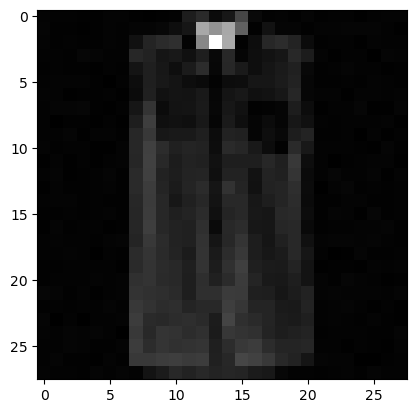

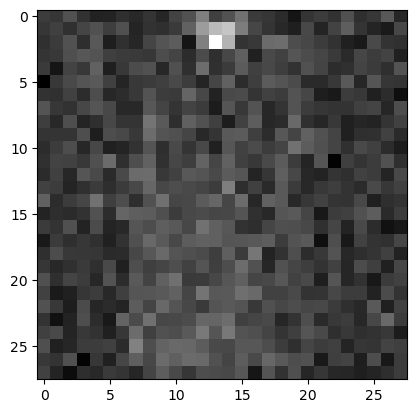

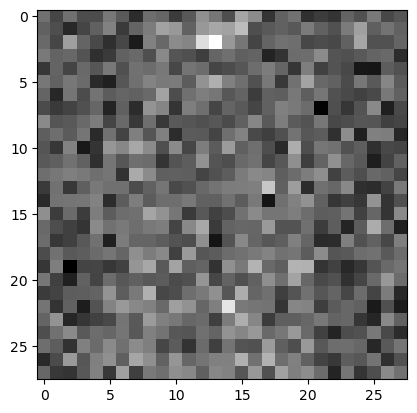

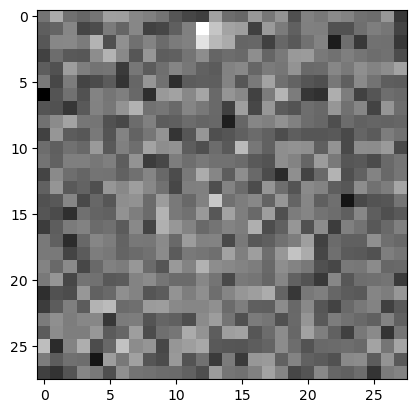

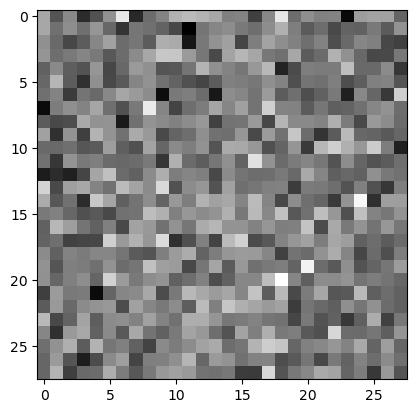

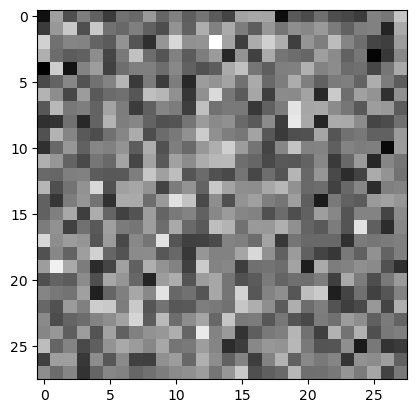

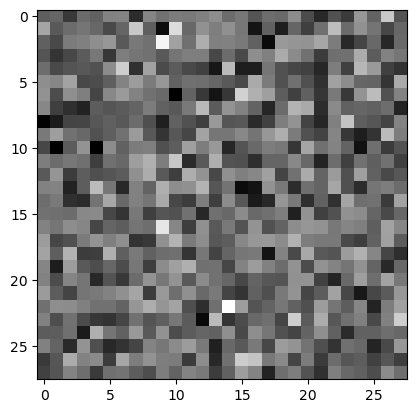

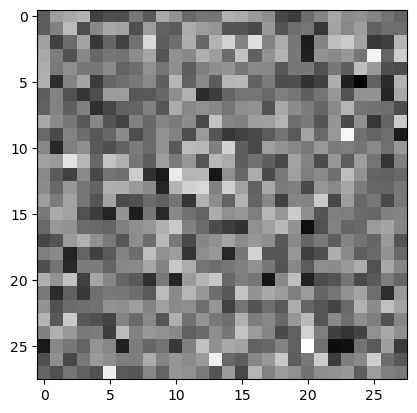

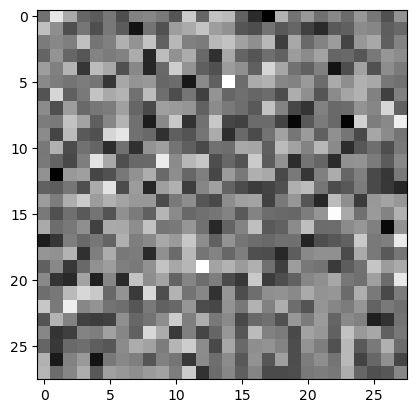

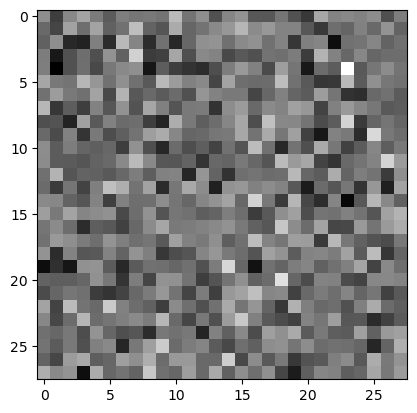

In [4]:
def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    '''
    output a vector of size timesteps that is equally spaced between start and end; this will be the noise that is added in each time step.
    '''
    beta = torch.linspace(start, end, timesteps)
    return beta


def forward_diffusion_sample(x_0, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod, device="cpu"):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    Hint: use the get_index_from_list function to select the right values at time t.
    """
    selected_sqrt_alphas_cumprod = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    selected_sqrt_one_minus_alphas_cumprod = get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x_0.shape)
    noise = torch.randn_like(x_0)
    x_t = selected_sqrt_alphas_cumprod * x_0 + selected_sqrt_one_minus_alphas_cumprod * noise

    return x_t,noise

# Define beta schedule
T = 300
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alpha = 1- betas
alphas_cumprod =torch.cumprod(alpha,dim = 0)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1 - alphas_cumprod)

# Simulate forward diffusion
batch = next(iter(dataloader))["pixel_values"]
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    img, noise = forward_diffusion_sample(batch[0,:,:,:], t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
    plt.imshow(img.reshape(28, 28), cmap="gray")
    plt.show()

[0.5 pt] Play around with the noise (compare two different beta schedules), present results for the two settings and discuss (in max. 3 lines) how the hyperparameters change the forward sampling. 

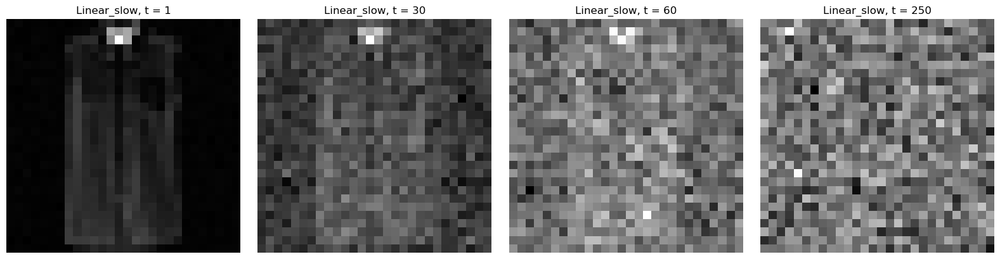

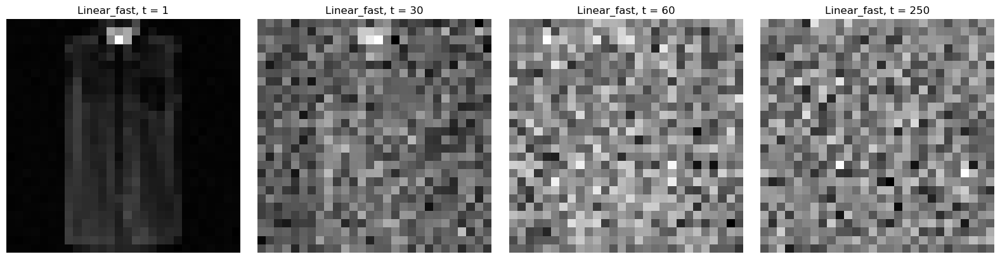

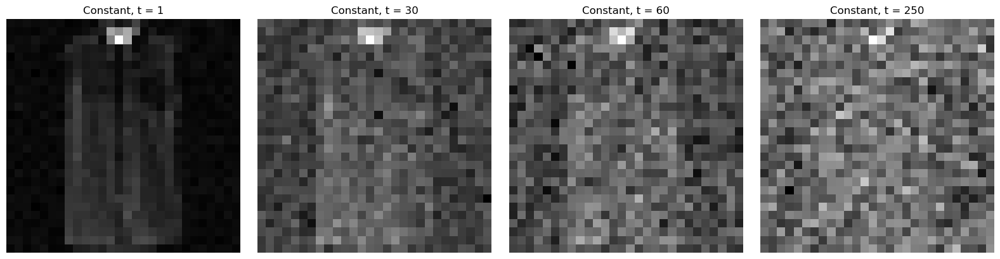

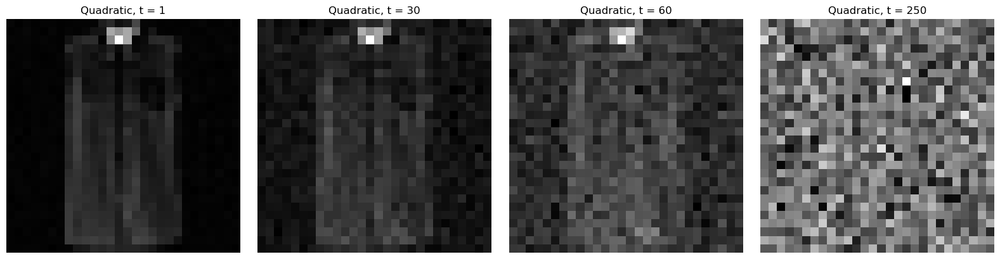

In [5]:
def constant_beta_schedule(timesteps, beta_value=0.01):
    '''
    Output a vector of size timesteps that is constant and equals beta_value; this will be the noise that is added in each time step.
    '''
    beta = torch.full((timesteps,), beta_value)
    return beta

def quadratic_beta_schedule(timesteps, start=0.0001, end=0.02):
    '''
    Output a vector of size timesteps that follows a quadratic curve from start to end; this will be the noise that is added in each time step.
    '''
    steps = torch.arange(timesteps).float() / (timesteps - 1)  # Normalize steps to [0, 1]
    beta = start + (end - start) * (steps ** 2)  # Apply quadratic transformation
    return beta

def calc_cumprod_sqrts(betas):
    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, dim=0)
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    return sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod


T = 300
linear_b_s = linear_beta_schedule(T, start=0.0001, end=0.02)
linear_b_f = linear_beta_schedule(T, start=0.0001, end=0.08)
constant_b = constant_beta_schedule(T,beta_value= 0.001)
quadratic_b = quadratic_beta_schedule(T)

# Creating a dictionary to iterate through schedules with labels
schedules = {
    "Linear_slow": linear_b_s,
    "Linear_fast": linear_b_f,
    "Constant": constant_b,
    "Quadratic": quadratic_b,
}

timesteps = [0,29, 59, 249]


# Iterate through each beta schedule
for label, beta_schedule in schedules.items():
    sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod = calc_cumprod_sqrts(beta_schedule)
    
    # Setup the plotting for each schedule in a single row
    plt.figure(figsize=(len(timesteps) * 4, 4))  # Adjust figure size based on the number of timesteps
    
    # For each timestep, generate and plot the diffusion sample
    for idx, time in enumerate(timesteps, start=1):
        img = forward_diffusion_sample(batch[0, :, :, :], torch.Tensor([time]).type(torch.int64), sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)[0]
        
        plt.subplot(1, len(timesteps), idx)  # Arrange plots in a row
        plt.imshow(img.reshape(28, 28), cmap='gray')  # Adjust for your image shape and color scheme
        plt.title(f"{label}, t = {time + 1}")
        plt.axis('off')
    
    plt.tight_layout()  # Adjust layout to not overlap
    plt.show()

Beta schemes determine the noise level added to images at each timestep in a diffusion process. The pace of detail loss across timesteps is positive correlated to speed of increase in beta. For example for quadratic beta scheme, noise increases quadratically quadratically, starting very slowly and accelerating towards the end. 

##### 2. The model for the noise [4 points]

We use a simple form of a UNet to predict the noise in the image. The input into the neural network will be a noisy image and the ouput from the model will be the noise in the image. It is important to also pass in the timestep into the neural network (so the model knows at which time we want to denoise the image) and we do this by passing it through a sinusoidal position embedding. 

[0.5pt] Write code for the Sinusoidal Position Embedding. This should output a matrix $PE$ of size `[timesteps, dimension]` with elements:

\begin{align}
&PE_{pos,2i} = \sin\left(\frac{pos}{10000^{2i/dim}}\right),\\
&PE_{pos,2i+1} = \cos\left(\frac{pos}{10000^{2i/dim}}\right),
\end{align}
where `pos` refers to the time position and `i` refers to the dimension position and `dim` the total dimension we are working with. 

Use however the following identity to implement: 
\begin{align}
\frac{pos}{10000^{2i/dim}} = \exp\left(\log(pos) - \frac{2i}{dim}\log(10000)\right).
\end{align}

In [6]:
class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super(SinusoidalPositionEmbeddings, self).__init__()
        self.dim = dim

    def forward(self, time):
        i = torch.arange(0, self.dim, 2).float()
        div = torch.exp( (-i / self.dim) * math.log(10000))
        embeddings = time[:, None] * div[None, :]
        sin = embeddings.sin()
        cos = embeddings.cos()
        stacked = torch.stack((sin, cos), dim=2)
        sin_cos_interleaved = stacked.reshape(*stacked.shape[:-2], -1)
        return sin_cos_interleaved

[0.5pt] Visualise the positional embeddings with arbitary time and dimension and discuss what position embeddings do (why do we add them, why this particular embedding structure) in max. 3 lines. 

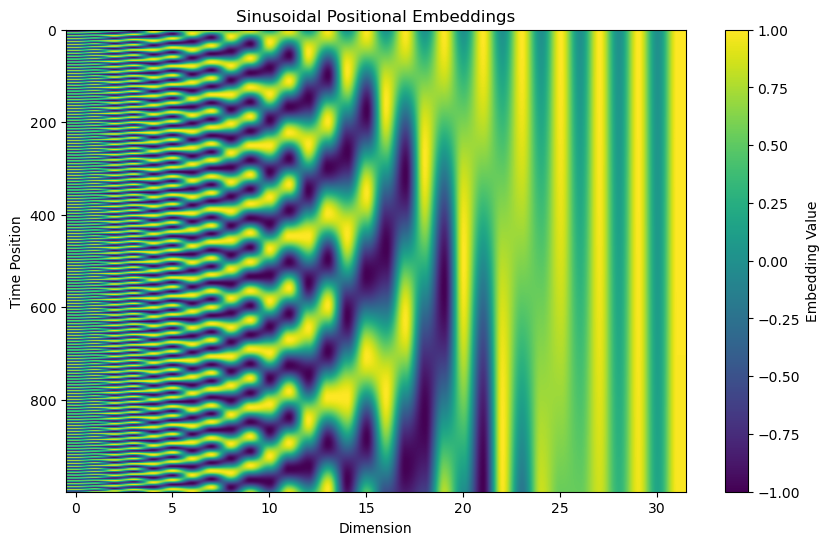

In [7]:
# Write here the code to visualise the positional embedding
embeddings = SinusoidalPositionEmbeddings(dim=32)

time_positions = torch.arange(0, 1000)
positional_embeddings = embeddings.forward(time_positions)

# Visualization
plt.figure(figsize=(10, 6))
plt.imshow(positional_embeddings.numpy(), cmap='viridis', aspect='auto')
plt.colorbar(label='Embedding Value')
plt.xlabel('Dimension')
plt.ylabel('Time Position')
plt.title('Sinusoidal Positional Embeddings')
plt.show()

Time embedding provide a way for the model to understand the order or position of elements in a sequence, which is vital because the model's input layers typically do not have an inherent sense of position or order. In our task, diffusion model, we need to know which time we are in order to denoise.Sinusoidal position embeddings is train-free, with unique value in which position, regardless size of dimension.

Below is the code for a Block, that will make up the final UNet. 

[0.5pt] Fill in the missing parts. 

Remember that in the UNet architecture, we have a downsampling phase and an upsampling phase. Depending on which phase we are in, we need to make use of the up or down-sample operations. 

[0.5pt] Add here an explanation as to what the block does including the up and downsample operations in maximum 3 lines:

Explanation of a Block: Block refers to a functional unit consisting of multiple layers such as convolutional layers, activation layers, pooling layers, to performs a specific operation. Each downsample you cut your data to increase receptive field, and study it's feature, the number of feature studied is decided by down chanel. Since we comprassed our data in downsample stage, we need upsample to reconstruct data using feature we obtained. This gives model ablity to combining local (high resolution) and global (low resolution) information.

In [8]:
class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        '''
        in_ch refers to the number of channels in the input to the operation and out_ch how many should be in the output
        '''
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()
        
    def forward(self, x, t):
        '''
        Define the forward pass making use of the components above.
        Time t should get mapped through the time_mlp layer + a relu
        The input x should get mapped through a convolutional layer with relu / batchnorm
        The time embedding should get added the output from the input convolution
        A second convolution should be applied and finally passed through the self.transform.
        '''
        h = self.relu(self.bnorm1(self.conv1(x)))
        # Process the time embedding
        time_emb = self.time_mlp(t)
        time_emb = self.relu(time_emb)
        # Extend time embedding to match the spatial dimensions of h
        time_emb = time_emb.view(time_emb.size(0), time_emb.size(1), 1, 1)
        # Add the time embedding to the convolved input
        h = h + time_emb
        # Second convolution
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Apply the transformation (downsampling or upsampling)
        return self.transform(h)

[1.5pt] Use the above code to fill in the code for the UNet below. 

In [17]:
class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self,down_channels = (64,128),up_channels = (128,64),time_emb_dim = 30, pad = True):
        super().__init__()
        image_channels = 1
         # These are the channels that we want to obtain in the downsampling stage; DEFINE YOURSELF!
         # These are the channels that we want to obtain in the upsampling stage; DEFINE YOURSELF!
        out_dim = 1 # DEFINE THIS CORRECTLY
        # DEFINE THIS CORRECTLY

        # Time embedding consists of a Sinusoidal embedding, a linear map that maintains the dimensions and a rectified linear unit activation.
        # TO WRITE CODE
        self.time_embedding = nn.Sequential(SinusoidalPositionEmbeddings(time_emb_dim),nn.Linear(time_emb_dim, time_emb_dim),nn.ReLU())
        # Initial projection consisting of a map from image_channels to down_channels[0] with a filter size of e.g. 3 and padding of 1.
        # TO WRITE CODE
        if pad == True:
            self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)
        else:
            self.conv0 = nn.Conv2d(image_channels, down_channels[0], 2, padding=0)
        # Downsample: use the Blocks given above to define down_channels number of downsampling operations. These operations should cha
        # TO WRITE CODE HERE; HINT: use something like Block(down_channels[i], down_channels[i+1], time_emb_dim) the right number of times.
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], time_emb_dim) for i in range(len(down_channels)-1)])
        # Upsample
        # TO WRITE CODE HERE; same logic as the downsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], time_emb_dim, up=True) for i in range(len(up_channels)-1)])
        # Final output: given by a final convolution that maps up_channels[-1] to out_dim with a kernel of size 1.
        # TO WRITE CODE
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_embedding(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet: iterate through the downsampling operations and the upsampling operations. Do not forget to include the residual connections
        # between the outputs from the downsample stage and the upsample stage.
        residual = []
        for block in self.downs:
            x = block(x, t)
            residual.append(x)
        for i, block in enumerate(self.ups):
            x = torch.cat((x, residual[-i-1]), dim=1)
            x = block(x, t)
        return self.output(x)
    

[0.5pt] Finally, define a loss function. Note that this loss function should take x_0 and t to sample the forward diffusion model, get a noisy image, use this noisy image in the model to get the noise added and finally compare true added noise and model outputs added noise. 

In [10]:
def l2_loss(model, x_0, t,sqrt_alphas_cumprod,sqrt_one_minus_alphas_cumprod):
    # Assuming sqrt_alphas_cumprod and sqrt_one_minus_alphas_cumprod are predefined constants
    x_noisy, noise = forward_diffusion_sample(x_0, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
    
    # Predict the noise with the model
    noise_pred = model(x_noisy, t)
    
    # Calculate the L2 norm squared of the difference between the actual noise and the predicted noise
    l2_norm_squared_loss = torch.mean((noise - noise_pred) ** 2)
    
    return l2_norm_squared_loss

def l1_loss(model, x_0, t,sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod):
    '''
    Define the right loss given the model, the true x_0 and the time t
    '''
    x_noisy, noise = forward_diffusion_sample(x_0, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

##### Part 3: The sampling [1 point]

Write a piece of code that can be used to predict the noise and return the denoised image. This function should work on a single image and make sure that the function can be used in the `sample` function properly. Note that we will need the `posterior_variance` denoted by $\sigma$ in the paper and the `sqrt_recip_alphas` given by $1/\alpha_t$. Make sure to set the right choice of $\sigma$ (see the paper). 

In [24]:
posterior_variance = betas 
sqrt_recip_alphas = torch.sqrt(1. / alpha)  

@torch.no_grad()
def sample_timestep(x, t, model):
    """
    Calls the model to predict the noise in the image and returns 
    the denoised image. 
    Applies noise to this image, if we are not in the last step yet.
    """

    mean = get_index_from_list(sqrt_recip_alphas, t, x.shape) * (x - get_index_from_list(betas, t, x.shape) * model(x, t) / get_index_from_list(sqrt_one_minus_alphas_cumprod, t, x.shape))    
    return mean if torch.eq(t, 0).all() else mean + torch.sqrt(get_index_from_list(posterior_variance, t, x.shape)) * torch.randn_like(x)

@torch.no_grad()
def sample(model, shape):
    device = next(model.parameters()).device

    b = shape[0]
    # start from pure noise (for each example in the batch)
    img = torch.randn(shape, device=device)
    imgs = []
    for i in reversed(range(0, T)):
        t = torch.full((b,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t, model)
        imgs.append(img.cpu().numpy())
    return imgs

##### Part 4. Write the training loop and present & interpret your results [6 points]

Code a training loop that instantiates the model, defines an optimiser, defines a number of epochs, iterates over the epochs and the datapoints inside the epoch and for each iteration samples a timestep, uses this timestep to loss function and update parameters based on this. 

Note: this is the part requiring most computational resources. You may need to train the model for quite a few epochs to get good results. Be sure to start on time to ensure enough access to GPUs on Google Colab. 

0.5 point will be given for correct implementation. 

1.5 points will be given according to how many **sensible** samples (with max points given for 10 good samples; scaled accordingly for less samples) you manage to obtain (i.e. the performance of your model in generating good datapoints). 

2 points will be given according to how efficient you can make the train process to still produce at least 10 good samples. You are free to change anything in the architecture! Your output will be compared to my base setup which uses `50` epochs and has a model with `Num params:  929409`. 1 point will be assigned scaled according to how much less epochs you can use and 1 points scaled with how much less params you manage to use. Be sure to print your number of parameters, training epochs and the 10 sensible images. 

2 points will be given for the interpretation of your results that allows us to better understand *how* the model learns. For this you are asked to visualise the generated samples during the training process. Can you identify any properties of *how* the model learns? Are there particular aspects the model starts paying attention to / is able to generate before others? 

In [14]:
#baisc set up
T = 300
betas = linear_beta_schedule(T)
alpha = 1- betas
alphas_cumprod =torch.cumprod(alpha,dim = 0)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1 - alphas_cumprod)
#set up for sample
posterior_variance = betas
sqrt_recip_alphas = torch.sqrt(1. / alpha)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [15]:
def trainning(epochs, model, dataloader, learning_rate, loss_type="l1"):
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    selected_indices = [(i*10)  for i in range(30)]
    
    for epoch in range(epochs):
        dataloader_with_tqdm = tqdm(enumerate(dataloader), total=len(dataloader), desc=f"Epoch {epoch}")
        for step, batch in dataloader_with_tqdm:
            optimizer.zero_grad()
            t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
            if loss_type == "l1":
                loss = l1_loss(model, batch['pixel_values'], t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
            else:
                loss = l2_loss(model, batch['pixel_values'], t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod)
            loss.backward()
            optimizer.step()
            dataloader_with_tqdm.set_description(f"Epoch {epoch} | step {step:03d} Loss: {loss.item():.4f}")
        
        with torch.no_grad():
            model.eval()
            sp = sample(model, shape=(1, 1, 28, 28)) 
            fig, axes = plt.subplots(1, len(selected_indices), figsize=(2*len(selected_indices), 2))
            for ax, idx in zip(axes, selected_indices):
                img = sp[idx].squeeze()
                if img.min() < 0:
                    img = (img + 1) / 2
                ax.imshow(img, cmap='gray')
                ax.axis('off')
            plt.show()
            model.train()
            

Epoch 0 | step 467 Loss: 0.1863: 100%|██████████| 468/468 [03:51<00:00,  2.02it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 416.04it/s]


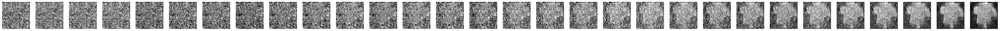

Epoch 1 | step 467 Loss: 0.1945: 100%|██████████| 468/468 [03:50<00:00,  2.03it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 504.50it/s]


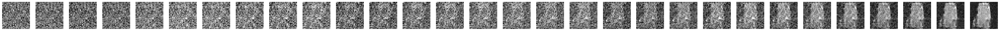

Epoch 2 | step 467 Loss: 0.1699: 100%|██████████| 468/468 [03:47<00:00,  2.05it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 418.33it/s]


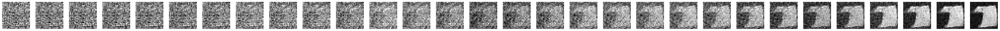

Epoch 3 | step 467 Loss: 0.1810: 100%|██████████| 468/468 [56:59<00:00,  7.31s/it]    
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 568.41it/s]


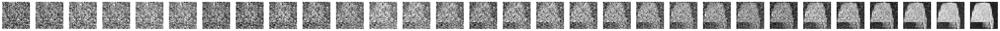

Epoch 4 | step 467 Loss: 0.1602: 100%|██████████| 468/468 [03:57<00:00,  1.97it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 547.83it/s]


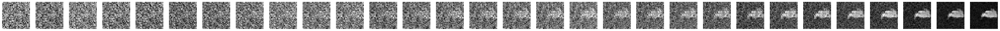

Epoch 5 | step 467 Loss: 0.1607: 100%|██████████| 468/468 [13:29:32<00:00, 103.79s/it]      
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 531.24it/s]


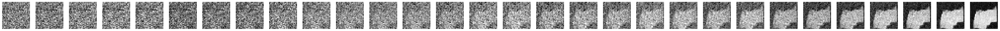

Epoch 6 | step 467 Loss: 0.1687: 100%|██████████| 468/468 [04:02<00:00,  1.93it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 560.12it/s]


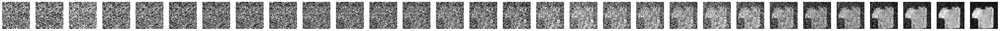

Epoch 7 | step 467 Loss: 0.1564: 100%|██████████| 468/468 [04:00<00:00,  1.95it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 398.52it/s]


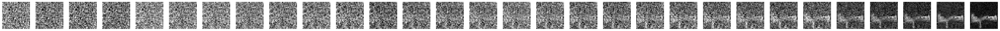

Epoch 8 | step 467 Loss: 0.1701: 100%|██████████| 468/468 [04:06<00:00,  1.90it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 380.36it/s]


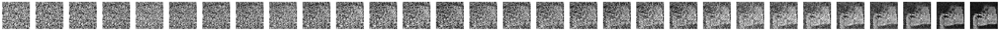

Epoch 9 | step 467 Loss: 0.1739: 100%|██████████| 468/468 [04:10<00:00,  1.87it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 542.86it/s]


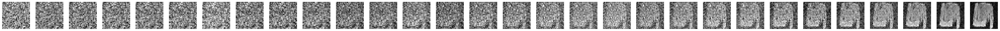

Epoch 10 | step 467 Loss: 0.1661: 100%|██████████| 468/468 [03:48<00:00,  2.05it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 470.43it/s]


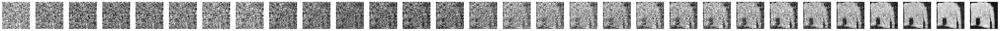

Epoch 11 | step 467 Loss: 0.1615: 100%|██████████| 468/468 [03:52<00:00,  2.02it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 536.33it/s]


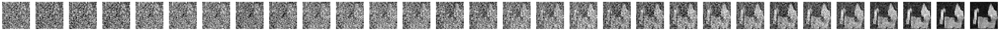

Epoch 12 | step 467 Loss: 0.1679: 100%|██████████| 468/468 [11:15<00:00,  1.44s/it]   
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 434.98it/s]


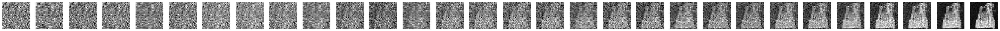

Epoch 13 | step 467 Loss: 0.1668: 100%|██████████| 468/468 [03:55<00:00,  1.99it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 508.11it/s]


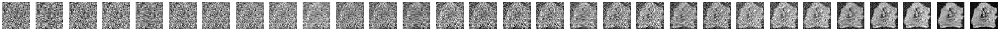

Epoch 14 | step 467 Loss: 0.1705: 100%|██████████| 468/468 [03:50<00:00,  2.03it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 483.48it/s]


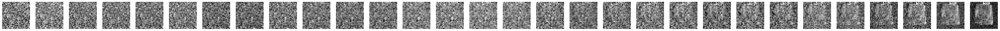

Epoch 15 | step 467 Loss: 0.1577: 100%|██████████| 468/468 [03:51<00:00,  2.02it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 592.10it/s]


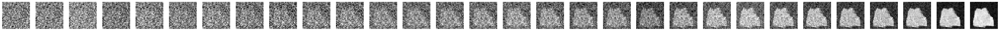

Epoch 16 | step 467 Loss: 0.1678: 100%|██████████| 468/468 [04:13<00:00,  1.85it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 544.65it/s]


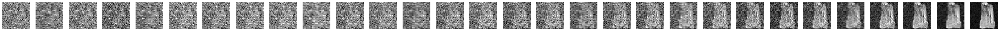

Epoch 17 | step 467 Loss: 0.1586: 100%|██████████| 468/468 [03:55<00:00,  1.99it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 519.02it/s]


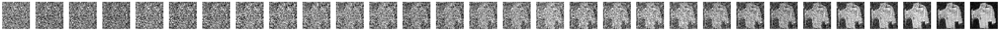

Epoch 18 | step 467 Loss: 0.1507: 100%|██████████| 468/468 [03:49<00:00,  2.04it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 522.37it/s]


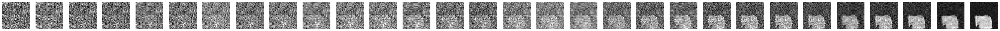

Epoch 19 | step 467 Loss: 0.1588: 100%|██████████| 468/468 [03:48<00:00,  2.05it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 566.62it/s]


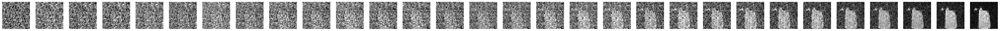

Epoch 20 | step 467 Loss: 0.1632: 100%|██████████| 468/468 [03:50<00:00,  2.03it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 560.84it/s]


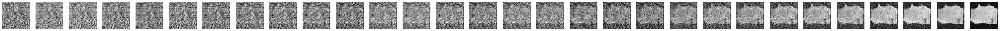

Epoch 21 | step 467 Loss: 0.1676: 100%|██████████| 468/468 [03:51<00:00,  2.02it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 635.71it/s]


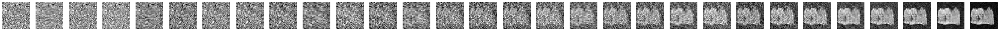

Epoch 22 | step 467 Loss: 0.1480: 100%|██████████| 468/468 [03:54<00:00,  1.99it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 453.13it/s]


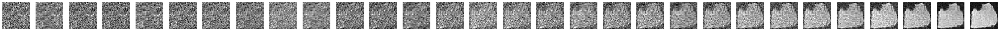

Epoch 23 | step 467 Loss: 0.1531: 100%|██████████| 468/468 [03:55<00:00,  1.99it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 468.15it/s]


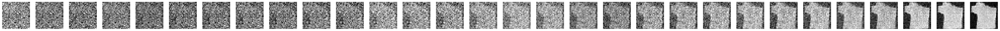

Epoch 24 | step 467 Loss: 0.1428: 100%|██████████| 468/468 [03:55<00:00,  1.99it/s]
sampling loop time step: 100%|██████████| 300/300 [00:00<00:00, 492.89it/s]


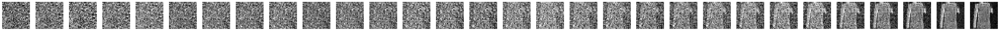

SimpleUnet(
  (time_embedding): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=16, out_features=16, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=16, out_features=32, bias=True)
      (conv1): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(32, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=16, out_features=64, bias=True)
      (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): C

In [20]:
model0 = SimpleUnet(
    down_channels= (16,32,64),
    up_channels=(64,32,16),
    time_emb_dim=16,
    pad = True
)
trainning(25,model0,dataloader,1e-3,loss_type = "l1")
model0.eval()


Finally, after training is done, use the `sample` to sample new images. 

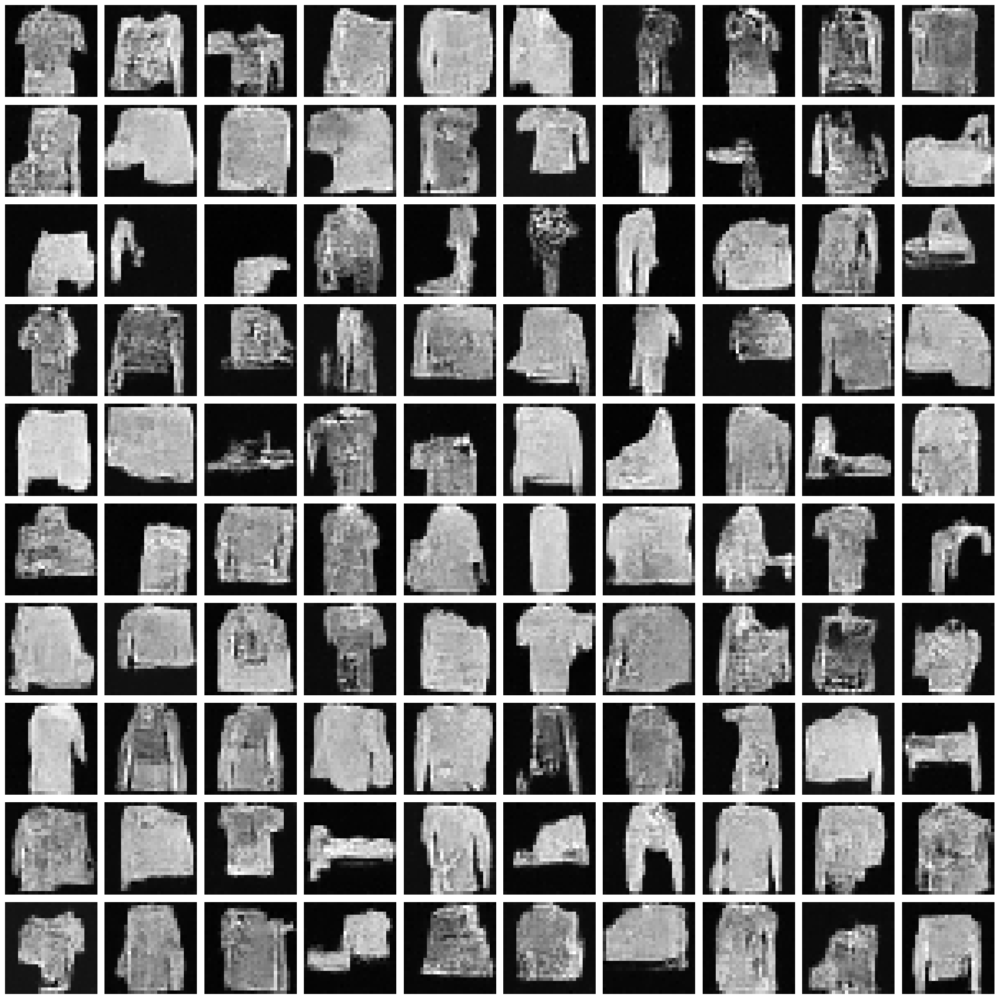

In [26]:
# Code for the plotting of samples goes here
selected_indices = [299]
sample_images = [] 


for i in range(100):
    sp = sample(model0, shape=(1, 1, 28, 28))  
    for idx in selected_indices:
        img = sp[idx].squeeze()
        if img.min() < 0:
            img = (img + 1) / 2
        sample_images.append(img)  


num_rows = len(sample_images) // 10 + (1 if len(sample_images) % 10 else 0)

plt.figure(figsize=(20, 2 * num_rows))  

for i, img in enumerate(sample_images):
    plt.subplot(num_rows, 10, i+1)
    plt.imshow(img, cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

Include your best generated samples below. 

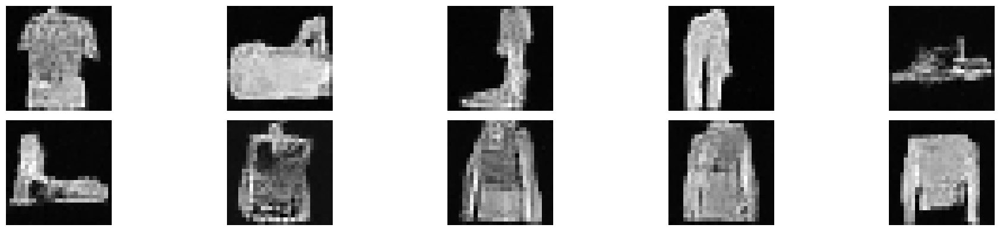

In [33]:
best_sample_indices = [0,19,24,26,42,48,68,71,72,99]
best_samples = [sample_images[i] for i in best_sample_indices if i < len(sample_images)]
plt.figure(figsize=(20, 4))  

for i, img in enumerate(best_samples):
    plt.subplot(2, 5, i+1)  
    plt.imshow(img, cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

Include your most efficient implementation details below.     

In [34]:
#----Here is my best set up， since I have already run it above, I will not train the model again in this block,

model0 = SimpleUnet(
    down_channels= (16,32,64),
    up_channels=(64,32,16),
    time_emb_dim=16,
    pad = True
)
trainning(25,model0,dataloader,1e-3,loss_type = "l1")

print("Num params: ", sum(p.numel() for p in model0.parameters()))

Num params:  233025


Interpretation of your results goes here.   
   
Visualization during trainning is already done in previous blocks.    
    
Apart from above set up, there are many set up I've tried. Here I will report about my observations.   
   
### Number of up/down channels: 
this is the most significant part the effects number of parameter and running time in our architecture. In each down sampling, we decrease the size of input by half, and we learn number of "feature" which is equal to number of corresponding channel. I find all of (16,32,64), (32,32,32), (32,64,128) down channels have good proformence. More channels we have, the larger the model is. Hence I choose (16,32,64) as my optimal choice. If we use less channels, the model will likely to be underfit.   
### Time embeddding dimention:
It also affects number of parameters in model, but it has less impact. 16 seems to be a good choice. If we set the dimention too high, we will just get random noise from the sampling, which might be overfitting.  
### Loss function:
Both l1 and l2 loss returns similar results. General speaking, l1 is more robust, l2 give better sample on good trainning set.
### Attention layer:
I tried to add attention layer in each block, however, this act will significantly increase size of model. With the same level of number of parameters, the performence of model with attention is not significantly better than model without attention layers. This might be cause we are trainning with data which is very limited resoluiton, making attention not as affective.
### Number of epochs:
In the optimal setting, 25 epochs gives a good result. If we looking at result per epochs, we can see that we don't need a lot of trainnnig to get a sample in "shapes".
### Concolusion:
The way model learned is as follows, each input will go through down sampling and up sampling stage. Which is similar idea of a autoencoder. In downsampling stage we tring to obtain important features and in up sampling we use features to construct outputs. Hence the number of channels significantly effects the model. Time embedding is introduced to help model to indentify which stage the are, this is important because diffusion moel is a time depent model, the behaviour of noise is different in different stage of sampling. Other setting mentioned above has tiny impact with our datasets. Due to time constrains, other hyperparameters such as learning rate is not invastigated. 

### Part 3. On DeepDream [5 points]

In this task we will implement a DeepDream model in order to generate ‘dreams’: images enhanced by the neural network. 

Here we will work with a pre-trained model (Inception-V3). The idea is as follows: we will load some image (you can later on choose to load your own image if you want). We will load the Inception-V3 model. We will pass it an input and obtain the activation outputs from a certain layer. We will 'ask' the neural network to maximise the values of the activation, i.e. enhance the image with what those layer activations 'like' to see. For this we will implement a gradient ascent method in order to maximise a norm of the activations over that input. This will change our input into a `dream'. 

1. [1 point] Write a piece of code that will load the Inception-V3 model and allow you to get access to the intermediate activations. 

2. [2 points] Implement the deepdream optimisation loop. We will use gradient ascent to optimise for the norm of the activation. Implement a function that performs this gradient ascent. This function will take as input the number of iterations to perform, the learning rate, and the start image (i.e. the image which the model will enhance). Define in the function a for loop over the number of iterations, obtain the model output, get the output of the hook (hint: use something like `outputs[-1]`), compute the loss which will be L2 norm of this output (i.e. the L2 norm of the activations from your chosen layer), compute the gradients of this L2 norm loss, scale the gradients by their absolute average (hint: scale using `torch.abs(g).mean()`) and define a gradient ascent step over the image. Do not forget to zero out gradients where needed. 

3. [1 point] Implement code to load an image (e.g. https://github.com/pytorch/hub/raw/master/images/dog.jpg) and display the output from your optimisation loop (using e.g. numpy). Present the generated images for different choices of layer activations and different number of optimisation steps. Discuss your results. What is the impact of using different layers? What is the impact of the number of optimisation steps? [0.5 point will be given for the implementation and 1.5 point for a very good discussion]

4. [1 point] In our previous setting we allowed for optimising for a single layer's activation. Change the method such that it will allow to compute the loss (L2 norm) of multiple layers' outputs. Present three different setups using different numbers & combinations of layers and discuss your results in max. 3 lines. 

Part 1 and 2. Loading model and picture and defining basic functions, also implementation of deep dream

In [35]:
#import modulues
import urllib
from torchvision import models, transforms
from PIL import Image
from torchvision.transforms import ToPILImage
import requests
from io import BytesIO
import random

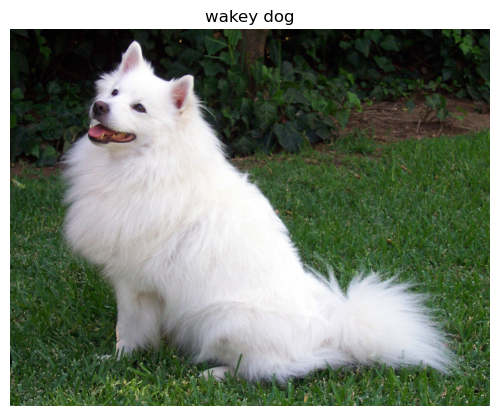

In [49]:
#loading trainning dog and define related methods
url = ("https://github.com/pytorch/hub/raw/master/images/dog.jpg")
response = requests.get(url)
img = Image.open(BytesIO(response.content))
transform = transforms.ToTensor()
wakey_dog = transform(img)

def display_images(img_tensors, titles):
    n = len(img_tensors)  # Total number of images
    images_per_row = 3  # Maximum number of images per row
    n_rows = (n + images_per_row - 1) // images_per_row  # Calculate the number of rows needed

    plt.figure(figsize=(images_per_row * 5, n_rows * 5))  #
    
    for i, (img_tensor, title) in enumerate(zip(img_tensors, titles), 1):
        plt.subplot(n_rows, images_per_row, i)  # Adjust subplot to accommodate n_rows and images_per_row
        img_tensor =  (img_tensor - img_tensor.min()) / (img_tensor.max() - img_tensor.min())  # Normalize the image tensor
        img_tensor = torch.squeeze(img_tensor)  
        plt.imshow(img_tensor.permute(1, 2, 0))  
        plt.title(title)
        plt.axis('off')
    
    plt.tight_layout()  
    plt.show()


display_images([wakey_dog],["wakey dog"])
plt.show()

In [37]:
model = models.inception_v3(pretrained=True).eval()

def get_activation(model, layer_names):
    activations = {}
    def save_activation(name):
        def hook(module, input, output):
            activations[name] = output  
        return hook
    hooks = []
    for name, layer in model.named_modules():
        if name in layer_names:
            hook = layer.register_forward_hook(save_activation(name))
            hooks.append(hook)

    return activations, hooks

def remove_hooks(hooks):
    for hook in hooks:
        hook.remove()

def deepdream(model, input_tensor, layer_names, iterations, learning_rate):
    activations, hooks = get_activation(model, layer_names)
    input_tensor.requires_grad_(True)

    for i in tqdm(range(iterations), desc="DeepDream Progress"):
        model.zero_grad()
        output = model(input_tensor)
        loss = sum(torch.norm(act,p=2) for act in activations.values())
        loss.backward()
        
        with torch.no_grad():
            gradients = input_tensor.grad
            gradients = gradients/(torch.abs(gradients).mean())
            input_tensor += gradients * learning_rate
            input_tensor.grad.zero_()

    remove_hooks(hooks)

    with torch.no_grad():
        output_tensor = torch.clamp(input_tensor, 0, 1)

    return output_tensor

/Users/yuewu/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/yuewu/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DeepDream Progress: 100%|██████████| 20/20 [00:53<00:00,  2.67s/it]


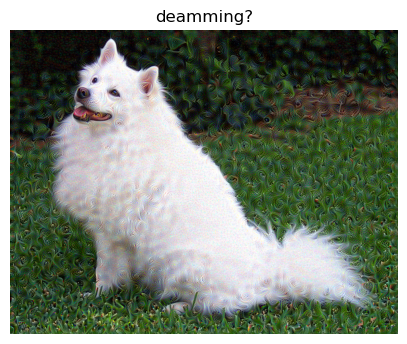

In [38]:
layer_names = ['Mixed_5d']  
iterations = 20  
learning_rate = 0.01 

img = wakey_dog.unsqueeze(0)
dream_image = deepdream(model, img, layer_names, iterations, learning_rate)
display_images([dream_image],["deamming?"])

Part 3. coding part

Processing layers: 100%|██████████| 3/3 [23:31<00:00, 470.35s/it]


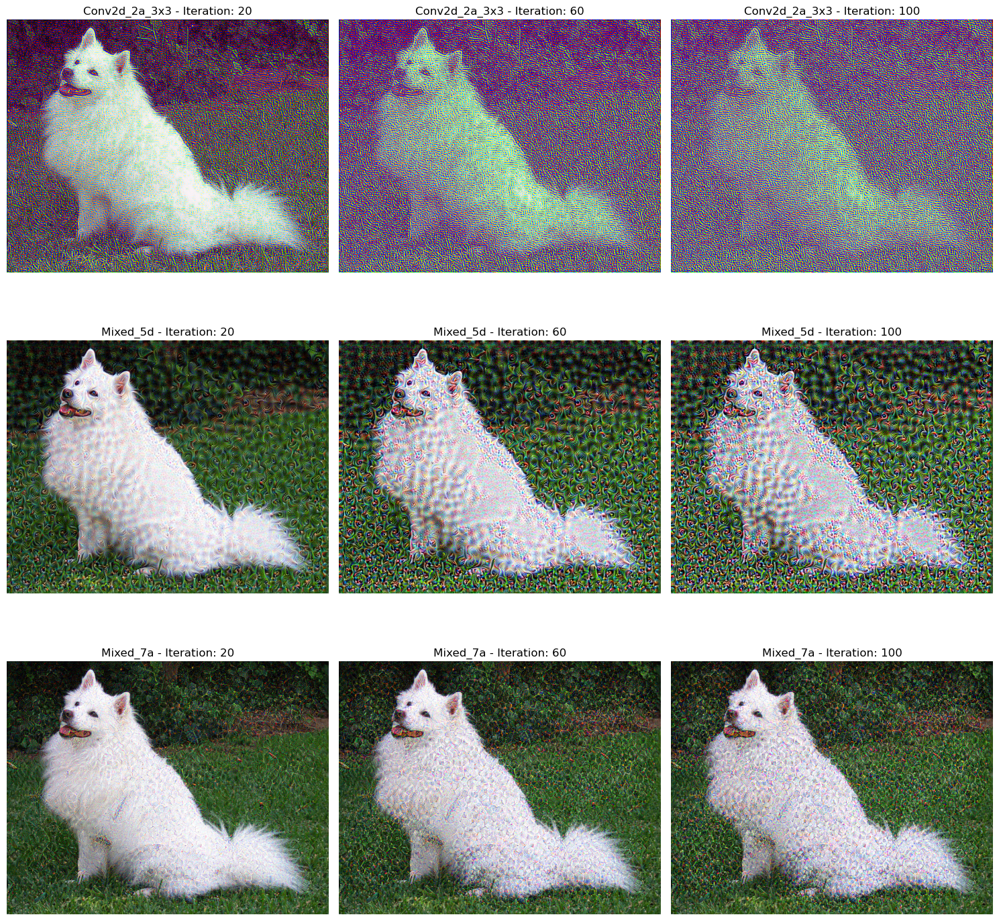

In [50]:
layer_names = ['Conv2d_2a_3x3', "Mixed_5d", "Mixed_7a"]
dreamed_images = []
titles = []
img = wakey_dog.unsqueeze(0)  
plot_iterations = [20, 60, 100]  

for layer_name in tqdm(layer_names, desc="Processing layers"):
    for iteration in plot_iterations:

        dreamed_image = deepdream(model, img.clone(), [layer_name], iterations=iteration, learning_rate=0.02)
        dreamed_images.append(dreamed_image)
        titles.append(f"{layer_name} - Iteration: {iteration}")

display_images(dreamed_images, titles)

Processing layers: 100%|██████████| 3/3 [00:02<00:00,  1.36it/s]


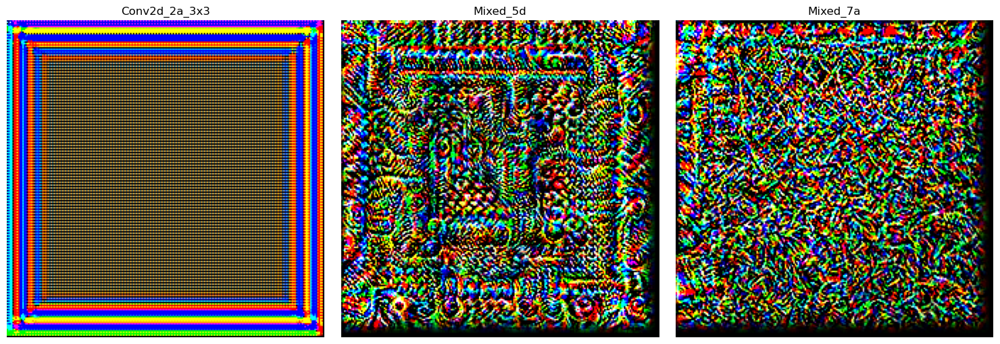

In [51]:
layer_names = ['Conv2d_2a_3x3',"Mixed_5d","Mixed_7a"]
dreamed_images = []
titles = []
empty = torch.zeros(1, 3, 224, 224, dtype=torch.float32)  
for layer_name in tqdm(layer_names, desc="Processing layers"):
    dreamed_image = deepdream(model, empty.clone(), [layer_name], iterations=10, learning_rate=0.2)
    dreamed_images.append(dreamed_image)
    titles.append(layer_name)
display_images(dreamed_images, titles) 

Part 3. discussion:  
    
Deep dream is based on the following idea: you have a trained model for classification, for classification models, each layer is considered as storing some kinda of "feature". We train our image to increase activation of those certain layers, that is, if we pass trained picture back to the classification model, those layer will be "activated", i.e., trained picture will contain features that the layer is trying to capture. Here I tried to visuilize what feature the layer is trying to capture first by passing a empty image first, then "dream" the dog. Inception_v3 is a classification model that is trianed based on large variaty of labels, hence feature in each layer is very abstract. I guess if we are using a model that is used for classify more spesific types, such as a model just for classify dogs and cats, we might have layer that dectect more specific feature such as head of dog and cat.    
   
For this course work, I choosed layers which called 'Conv2d_2a_3x3',"Mixed_5d" and "Mixed_7a". From the first figure(visualiztion of feature) we can see that 'Conv2d_2a_3x3' focused on color,"Mixed_5d" and "Mixed_6b" focused on difference kind of shapes, where "Mixed_5d" is like a shell of a nail and "Mixed_7a" is like turtle shells. For each trainning loop, we are preturbe our image a little bit(controlled by learning rate) and trying to add feature to our image. The change of image is likely to apprear on parts of picture which is similar to feature of the layer(Due to gradient). Hence we can observe that for 'Conv2d_2a_3x3' it's more of a gobal color filter but for "Mixed_5d", the back ground and the outline of the dog, becuase outline of dog's "texture" has that kind of curly shape but inner part doesn't.  For "Mixed_7a", the feature is smaller, hence it's modifying the inner part of dog more.     

As we increase the number of training, the more and more "feature" start to appear, I believe with enough trainning step and right step up, all picture processed by deepdream will converge to the same picture(Global maxima).

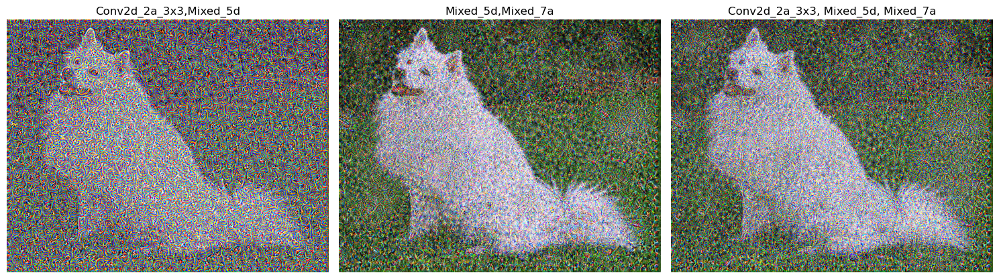

In [53]:
comb = [['Conv2d_2a_3x3',"Mixed_5d"],["Mixed_5d","Mixed_7a"],['Conv2d_2a_3x3',"Mixed_5d","Mixed_7a"]]
dreamed_images = []
img = wakey_dog.unsqueeze(0)
for layer_name in tqdm(comb, desc="Processing layers"):
    dreamed_image = deepdream(model, img.clone(), layer_name, iterations=20, learning_rate=0.1)
    dreamed_images.append(dreamed_image)
    titles.append(layer_name)
display_images(dreamed_images, ['Conv2d_2a_3x3,Mixed_5d', "Mixed_5d,Mixed_7a","Conv2d_2a_3x3, Mixed_5d, Mixed_7a"],)

Discusion:   
For combination of layers, the logic is similar. Here we are tring to maximize the output of activation of multiple layers. Hence we can observe that the "feature" of both layer appears on the dreamed figure. For example, in combination of conv2d and mixed 5d, both "color filter" effect and little spiral appears. For combination of mixed 5d and mixed 7a，we can observe both "feature", but mixed_7a seems to be dominating. This might be caused by 2 reasons, first feature of mixed 7a is smaller hence easir to optimize, second, mixed 7a have more nodes hence it's easier to increase it's activarion value.